In [4]:
import pyvis
import networkx as nx
import altair as alt
import nx_altair as nxa
from nx_altair.core import to_pandas_nodes

from rdkit import RDLogger
from rdkit import Chem
from rdkit.Chem import AllChem
import rdkit.Geometry
from rdkit.Chem import rdFMCS
from rdkit.Chem.Draw import IPythonConsole, MolToFile
from rdkit.Chem.Scaffolds import rdScaffoldNetwork
from rdkit.Chem import PandasTools

RDLogger.DisableLog('rdApp.info')

%matplotlib inline

alt.data_transformers.enable('default', max_rows=None)
alt.renderers.enable('notebook')

In /opt/conda/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The text.latex.preview rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /opt/conda/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /opt/conda/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
In /opt/conda/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The validate_bool_maybe_none function was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /opt/conda/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The savefig.

RendererRegistry.enable('notebook')

# Read Data

## Read graph

In [2]:
G = nx.read_gml('/mnt/data/results/OSM_model_round2/graph.gml')
pos = nx.kamada_kawai_layout(G, scale=0.6)
#pos = nx.spectral_layout(G)

In [5]:
# Draw the graph using Altair
#viz = nxa.draw_networkx(
#    G=G,
#    pos=pos,
#    node_size=80,
#    alpha=1.0)
#
#viz.interactive()

In [10]:
# edges = viz.layer[0]
# nodes = viz.layer[1]
# color_range = ["#AEC7E8", "#FFBB78", "#98DF8A", "#FF9896", "#C5B0D5", "#C49C94", "#F7B6D2", "#C7C7C7"]
# color_strong_range = ["#1F77B4", "#FF7F0E", "#2CA02C", "#D62728", "#9467BD", "#8C564B", "#E377C2", "#C7C7C7"]

# edges = edges.encode(opacity=alt.value(0.1))

# nodes = nodes.encode(
#    stroke = alt.Color('community', title='Module',
#                   scale=alt.Scale(domain=comm_sort.index.tolist(),
#                                   range=color_strong_range)),
#    fill=alt.Color('community', title='Module', 
#                   scale=alt.Scale(domain=comm_sort.index.tolist(),
#                                   range=color_range))
#)

# viz = alt.layer(edges, nodes)

# viz.configure_axis(
#        ticks=False,
#        grid=False,
#        domain=False,
#        labels=False,
#    ).configure_legend(
#  titleFontSize=17,
#  labelFontSize=14,
# ).properties(width=800, height=580).interactive()

In [7]:
molecules_df = to_pandas_nodes(G, pos)
molecules_df.head()

,x,y,Series,community,louvain,degree
OSM-A-1,0.4393,0.181697,1,m01,m01,29
OSM-A-2,0.560044,0.177073,1,m01,m01,28
OSM-A-3,0.432381,0.221518,1,m01,m01,29
OSM-E-1,0.351108,-0.000414354,1,m01,m01,20
OSM-E-2,0.327046,0.0705779,1,m01,m01,22


## Read Fingerprints

In [8]:
import modSAR
from modSAR.network_algorithms import ModSAR
from modSAR.dataset import QSARDataset, QSARDatasetIO

dataset_morgan2 = \
    QSARDatasetIO.load(dataset_name='OSM4',
                   activity_sheetname='activity',
                   smiles_column='Canonical_Smiles',
                   id_column='OSM_ID',
                   filepath='/mnt/data/OSM-S4/osm4_qsardataset_morgan2.xls',
                   calculate_similarity=False)

In [9]:
import pandas as pd

molecules_df = pd.merge(molecules_df, 
                        dataset_morgan2.metadata[["Canonical_Smiles"]], 
                        left_index=True, 
                        right_index=True)

## Equivalence between Modules and Series

In [149]:
osm_series = molecules_df.Series
osm_series = osm_series.apply(lambda x: '4' if x == 'not4' else ('1' if x == 'TB' else x))
osm_series.name = "OSM Data"
osm_series = osm_series.apply(lambda x: 'Series '+x)

modules = molecules_df.community
modules.name = "Modules"

pd.crosstab(modules, osm_series)

OSM Data,Series 1,Series 2,Series 3,Series 4
Modules,,,,
m01,52,0,0,0
m02,1,0,0,0
m03,0,0,47,0
m04,0,0,1,0
m05,0,0,0,121
m06,0,1,0,116
m07,0,0,0,8


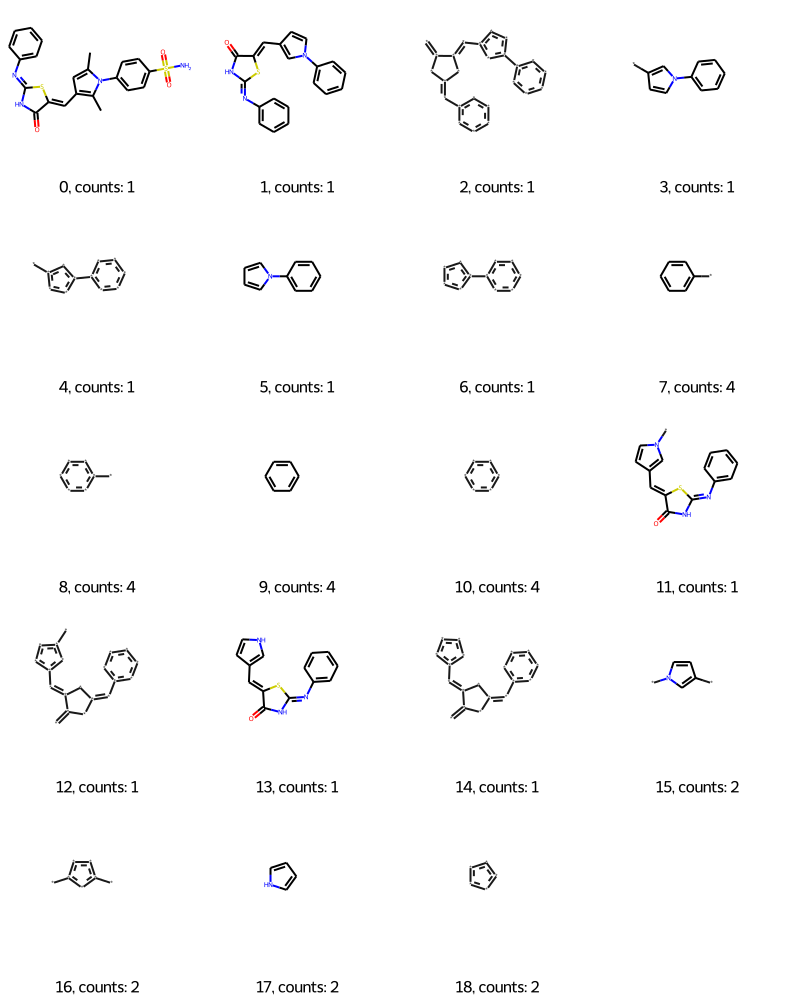

In [8]:
random_sample = Chem.MolFromSmiles(molecules_df.iloc[0]['Canonical_Smiles'])

net = rdScaffoldNetwork.CreateScaffoldNetwork([random_sample],rdScaffoldNetwork.ScaffoldNetworkParams())

nodemols = [Chem.MolFromSmiles(x) for x in net.nodes]
Chem.Draw.MolsToGridImage(nodemols,legends=['{0}, counts: {1}'.format(i,c) for i,c in enumerate(net.counts)],molsPerRow=4)


In [61]:
# import os
# from pyvis.network import Network
# from rdkit.Chem.Draw import IPythonConsole, rdMolDraw2D

# def moltosvg(mol,molSize=(450,250),kekulize=True):
#    mc=rdMolDraw2D.PrepareMolForDrawing(mol)
#    drawer = rdMolDraw2D.MolDraw2DSVG(molSize[0],molSize[1])
#    opts = drawer.drawOptions()
#    drawer.DrawMolecule(mc)
#    drawer.FinishDrawing()
#    svg = drawer.GetDrawingText()
#    return svg.replace('svg:','')

# if not os.path.isdir('./illu_net'):
#    os.mkdir('./illu_net')
    
# g = Network(notebook=True,height='800px',width='1300px')

# for i,n in enumerate(net.nodes):
#    svg=moltosvg(Chem.MolFromSmiles(n))
#    with open('./illu_net/{0}.svg'.format(i),'w') as outf:
#        outf.write(svg)
#    g.add_node(i,shape="image",label=' ',
#               image ='./illu_net/{0}.svg'.format(i), title=svg, size=60)
#for e in net.edges:
#    g.add_edge(e.beginIdx,e.endIdx,label=str(e.type))
    
#g.set_options(options="""{
#  "edges": {
#   "font":{
#   "size":20
#   }
#  },
#  "nodes": {
#    "font": {
#      "color": "rgba(214,47,66,1)",
#      "size": 16,
#      "face": "tahoma"
#    }
#  },
#  "physics": {
#    "forceAtlas2Based": {
#      "gravitationalConstant": -120,
#      "springLength": 200,
#      "avoidOverlap": 0.42
#    },
#    "minVelocity": 0.75,
#    "solver": "forceAtlas2Based"
#  }
#}""")
# g.show("./scaffoldnetwork_illu_flu.html")

# Module representativity

Discriminatory power of each module

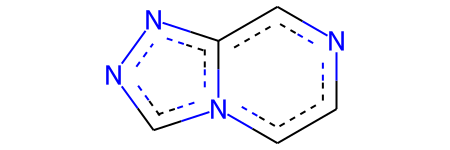

In [12]:
from rdkit.Chem.Scaffolds import rdScaffoldNetwork
from rdkit.Chem.Scaffolds import MurckoScaffold

def get_scaffold_pattern(df, smiles_col='Canonical_Smiles'):
    params = rdScaffoldNetwork.ScaffoldNetworkParams() 
    params.includeGenericScaffolds = False
    params.includeGenericBondScaffolds = False
    params.includeScaffoldsWithoutAttachments=False
    
    smiles_mols = [smiles_code for smiles_code in df[smiles_col]]
    mols = [Chem.MolFromSmiles(smiles_code) for smiles_code in smiles_mols]
    
    net = rdScaffoldNetwork.CreateScaffoldNetwork(mols, params)
    return net

def get_mcs_pattern(df, smiles_col='Canonical_Smiles'):
    mols = [Chem.MolFromSmiles(smiles_code) for smiles_code in df[smiles_col]]
    res = rdFMCS.FindMCS(mols)
    pattern = Chem.MolFromSmarts(res.smartsString)
    return pattern

def get_representative_scaffold(module_df, smiles_col='Canonical_Smiles'):
    net = get_scaffold_pattern(module_df, smiles_col)

    df = pd.DataFrame({'pattern': net.nodes, 'count': net.counts})
    df['pctg'] = df["count"].apply(lambda x: x/module_df.shape[0])
    df = df[(df["pctg"] < 1) & (df["pctg"] > 0.5)].copy()
    df['pctg'] = df['pctg'].apply(lambda x: "%.2f %%" % (100*x))

    PandasTools.AddMoleculeColumnToFrame(df,'pattern','scaffold',includeFingerprints=True)
    return df.sort_values('count', ascending=False)



## Series 4 - Generic Scaffold

,pattern,count,pctg,scaffold
4,*c1cncc2nnc(-c3ccccc3)n12,178,83.57 %,
13,*c1nnc2cncc(OCCc3ccccc3)n12,120,56.34 %,

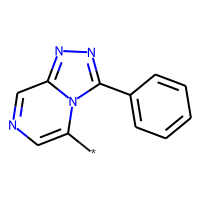
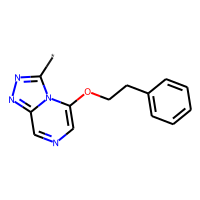

In [29]:
s4_scaffolds = get_representative_scaffold(molecules_df[molecules_df['Series'] == "4"])

s4_dominant_scaffold = Chem.MolFromSmarts(s4_scaffolds['pattern'].iloc[0])

s4_scaffolds

Maximum Common Substructure

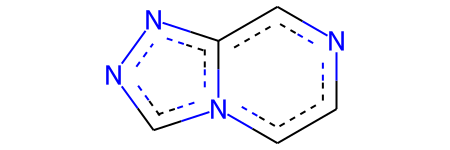

In [15]:
s4_pattern = get_mcs_pattern(molecules_df[molecules_df['Series'] == "4"])

s4_pattern

## Module m05

,pattern,count,pctg,scaffold
3,*c1nnc2cncc(OCCc3ccccc3)n12,97,80.17 %,
4,*c1cncc2nnc(-c3ccccc3)n12,67,55.37 %,

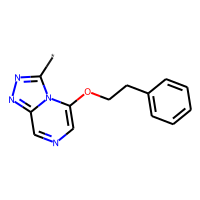
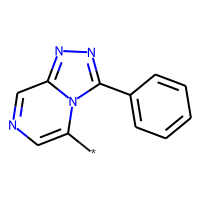

In [17]:
get_representative_scaffold(molecules_df[molecules_df['community'] == "m05"])

## Module m06

,pattern,count,pctg,scaffold
6,*c1cncc2nnc(-c3ccccc3)n12,111,94.87 %,

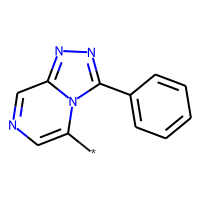

In [18]:
get_representative_scaffold(molecules_df[molecules_df['community'] == "m06"])

## Module m07

,pattern,count,pctg,scaffold
4,*c1nccn2c(-c3ccccc3)nnc12,7,87.50 %,

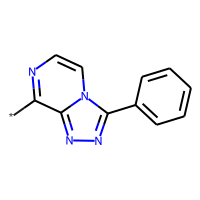

In [19]:
get_representative_scaffold(molecules_df[molecules_df['community'] == "m07"])

## Module m01

,pattern,count,pctg,scaffold
2,*c1ccn(-c2ccccc2)c1,43,82.69 %,

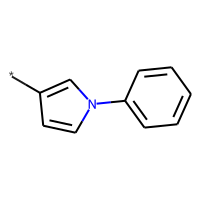

In [20]:
get_representative_scaffold(molecules_df[molecules_df['community'] == "m01"])

## Module m03

,pattern,count,pctg,scaffold
3,*c1cc2ncncc2s1,31,65.96 %,

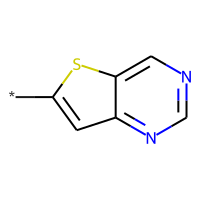

In [21]:
get_representative_scaffold(molecules_df[molecules_df['community'] == "m03"])

# Representative compounds



In [2]:
from rdkit.Chem.Draw.MolDrawing import DrawingOptions

def plot_representative_of_module(df, selected_module, 
                                  smiles_col='Canonical_Smiles', align_pattern=None, 
                                  folder="/mnt/data/results/OSM_model_round2/"):
    
    module_df = df[df['community'] == selected_module]
    
    degrees = sorted(G.subgraph([node[0] for node in G.nodes(data=True) 
                                           if node[1]['community'] == selected_module]),
                     key=lambda x: x[1], reverse=True)
    
    idx = 0
    while idx < len(degrees):
        try:
            highest_degree_id = degrees[idx]
            #highest_degree_id = module_df['degree'].astype(int).idxmax()
            print("Representative molecule of module {} selected: {}".format(selected_module, highest_degree_id))
            highest_degree_mol = Chem.MolFromSmiles(module_df.loc[highest_degree_id]['Canonical_Smiles'])
            print("Canonical Smiles: ", module_df.loc[highest_degree_id]['Canonical_Smiles'])

            module_pattern = get_representative_scaffold(module_df, smiles_col='Canonical_Smiles')
            module_pattern = Chem.MolFromSmarts(module_pattern["pattern"].iloc[0])

            if align_pattern is not None:
                AllChem.Compute2DCoords(align_pattern)
                AllChem.GenerateDepictionMatching2DStructure(highest_degree_mol, align_pattern)

            matching = highest_degree_mol.GetSubstructMatch(module_pattern)
            hit_bonds = []
            for bond in module_pattern.GetBonds():
                aid1 = matching[bond.GetBeginAtomIdx()]
                aid2 = matching[bond.GetEndAtomIdx()]
                hit_bonds.append(highest_degree_mol.GetBondBetweenAtoms(aid1,aid2).GetIdx())
            break
        except:
            idx = idx + 1
        
        
    drawing_opts = DrawingOptions()
    drawing_opts.bgColor=None
    drawing_opts.colorBonds = False
    drawing_opts.includeAtomNumbers = True
    
    filename = '%s/%s_%s_pattern.svg' % (folder, selected_module, highest_degree_id)
    print("Saving %s" % filename)
    Chem.Draw.MolToFile(highest_degree_mol, filename, size=(400, 300),
                        highlightAtoms=matching, highlightBonds=hit_bonds, 
                        kekulize=True,
                        options=drawing_opts)
    
    return  Chem.Draw.MolToImage(highest_degree_mol,
                     size=(400, 300), kekulize=True, 
                     highlightAtoms=matching, highlightBonds=hit_bonds,
                     options=drawing_opts,)

#    return module_pattern

## Module m05

In [3]:
plot_representative_of_module(molecules_df, selected_module='m05', align_pattern=s4_dominant_scaffold)

NameError: name 'molecules_df' is not defined

## Module m06

Representative molecule of module m06 selected: OSM-S-498
Saving /mnt/data/results/OSM_model_round2//m06_OSM-S-498_pattern.svg


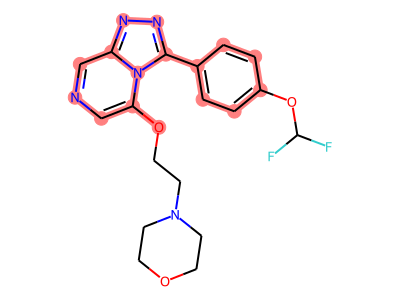

In [101]:
plot_representative_of_module(molecules_df, selected_module='m06', align_pattern=s4_dominant_scaffold)

## Module m07

Representative molecule of module m07 selected: OSM-S-631
Representative molecule of module m07 selected: OSM-S-630
Saving /mnt/data/results/OSM_model_round2//m07_OSM-S-630_pattern.svg


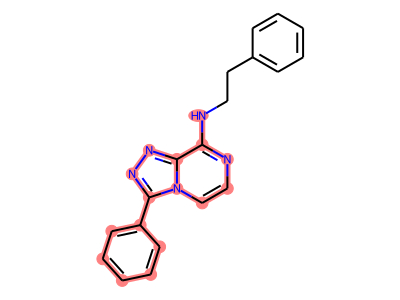

In [105]:
plot_representative_of_module(molecules_df, selected_module='m07', align_pattern=s4_pattern)

## Module m01

Representative molecule of module m01 selected: OSM-A-2
Saving /mnt/data/results/OSM_model_round2//m01_OSM-A-2_pattern.svg


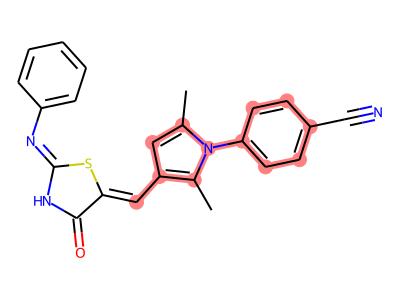

In [103]:
plot_representative_of_module(molecules_df, selected_module='m01')

## Module m03

Representative molecule of module m03 selected: OSM-S-135
Saving /mnt/data/results/OSM_model_round2//m03_OSM-S-135_pattern.svg


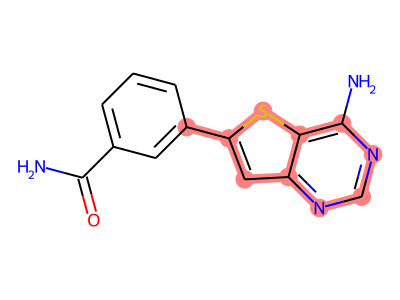

In [104]:
plot_representative_of_module(molecules_df, selected_module='m03')

## Singletons

**OSM-S-69** -> m02

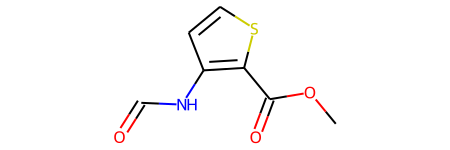

In [135]:
 Chem.MolFromSmiles(molecules_df.loc["OSM-S-69"]['Canonical_Smiles'])

**OSM-S-89** -> m04

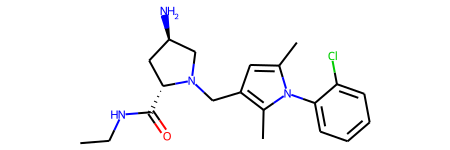

In [136]:
 Chem.MolFromSmiles(molecules_df.loc["OSM-S-89"]['Canonical_Smiles'])